# Lab 1: Sampling and coding basics

This lab aims to get familiar with the basics of audio sampling and of coding audio signals, listening to its effect.

Make sure you understand all the code given and its signal processing task before answering the questions. Use headphones to listen to the sounds when doing the different exercises.

To do the labs best is to use Visual Studio Code, cloning this repository, `git clone https://github.com/xserra/audio-coding-materials.git`, and installing the material as described in the README file of the repository. You should submit the python notebook through the Aula Global. The notebooks should be selfcontained.

## Relevant concepts:

### Spectrum
The magnitude spectrum of a sound fragment describes the magnitudes of its sinusoidal components as a function of frequency.

### Spectrogram
The magnitude spectrogram of a sound is a visual way to represent a sequence of magnitude spectra computed over a whole sound, thus showing the time-varying nature of a sound.

### Sampling Rate
Number of samples of a signal taken every second. It defines the frequency range obtained.

### Bit depth
Number of bits used to represent every sample of a signal. It defines the dynamic range obtained.

### Resampling
Changing the sampling rate of a signal. It is first important to filter out the frequencies that cannot be represented in the new sampling rate.

### Quantization
Changing the number of bits used to represent every sample of a signal.

### MP3
Formally MPEG-1 Audio Layer III is a coding format for digital audio commonly used on internet applications.

In [2]:
import os
import numpy as np
import matplotlib.pyplot as plt
import scipy.signal as signal
from scipy.fft import fft
import IPython.display as ipd
from scipy.io.wavfile import read
from pydub import AudioSegment

In [3]:
# functions used in the whole lab
def read_sound(file):
  """ read a mono wav sound file, assuming is mono, and convert it to a floating point array
    Args:
      file (str): File name
    Returns:
      sound_array (numpy.array): Array of samples as floating point values between -1 and 1
      sampling_rate (int): Sampling rate
  """
  # read sound file
  sampling_rate, x = read(file)
  # convert to floating point values between -1 and 1, assuming x are 16 bit integers
  sound_array = np.float32(x) / 2**15
  return sound_array, sampling_rate

def display_sound(sound_array, sampling_rate=44100):
  """ Display signal sound_array
    Args:
      sound_array (numpy.array): Array of samples
      sampling_rate (int): Sampling rate
  """
  # plot the waveform of the sound
  plt.figure(0, figsize=(10, 3))
  time_indexes = np.arange(0, sound_array.size/sampling_rate, 1.0/sampling_rate)
  plt.plot(time_indexes, sound_array)
  plt.xlabel('time (seconds)')
  plt.ylabel('amplitude')
  plt.show()
  # play the sound
  ipd.display(ipd.Audio(data=sound_array, rate=sampling_rate))

def display_spectrum(sound_array, sampling_rate=44100):
  """ Display magnitude spectrum of signal sound_array
    Args:
      sound_array (numpy.array): Array of samples
      sampling_rate (int): Sampling rate
  """
  # compute the hanning window
  window = signal.get_window('hann', sound_array.size)
  # compute the spectrum of the windowed input signal
  spectrum = fft(window*sound_array)
  # compute the magnitude spectrum in dB
  magnitude_spectrum = 20*np.log10(abs(spectrum[:spectrum.size//2]))

  # Generate frequency indexes
  frequency_indexes = np.arange(0, sampling_rate / 2, sampling_rate / spectrum.size)
    
  # All commented lines correspond to the zooming of the spectrum
  # Find the index corresponding to the maximum frequency (1000 Hz)
  #max_index = np.where(frequency_indexes <= 1000)[0][-1]

  # Truncate the frequency indexes and magnitude spectrum to only show up to 1000 Hz
  #truncated_frequencies = frequency_indexes[:max_index+1]
  #truncated_magnitude_spectrum = magnitude_spectrum[:max_index+1]
  
  # plot the magnitude spectrum
  plt.figure(0, figsize=(10, 5))
  frequency_indexes = np.arange(0, sampling_rate/2, sampling_rate/spectrum.size)
  plt.plot(frequency_indexes, magnitude_spectrum)
  #plt.plot(truncated_frequencies, truncated_magnitude_spectrum)
  plt.xlabel('frequency (Hz)')
  plt.ylabel('amplitude (dB)')
  
  # Set the ticks on the x-axis (frequency axis) to appear at the specified interval
  #plt.xticks(np.arange(0, 1000 + 50, 50))
  
  plt.show()

def display_spectrogram(sound_array, hop_size=256, fft_size=512, sampling_rate=44100):
  """ Display magnitude spectrogram of signal sound_array
    Args:
      sound_array (numpy.array): Array of samples
      hop_size (int): window hop size
      fft_size (int): Spectrogram fft size
      sampling_rate (int): Sampling rate of sound
  """
  # compute the hanning window
  window = signal.get_window('hann', fft_size)
  # initialize the output spectrogram
  magnitude_spectrogram = []
  sample_index = 0
  # iterate over the input sound computing a sequence of spectra
  while sample_index < sound_array.size-fft_size:
    spectrum = fft(window*sound_array[sample_index:sample_index+fft_size])
    magnitude_spectrum = 20*np.log10(abs(spectrum[:spectrum.size//2]))
    magnitude_spectrogram.append(magnitude_spectrum)
    sample_index += hop_size

  # plot the magnitude spectrogram
  plt.figure(figsize=(10, 5))
  time_indexes = np.arange(0, sample_index/sampling_rate, hop_size/sampling_rate)
  frequency_indexes = np.arange(0, sampling_rate/2, sampling_rate/fft_size)
  plt.pcolormesh(time_indexes, frequency_indexes, np.transpose(magnitude_spectrogram), shading='nearest', cmap='inferno')
  plt.colorbar(format='%+2.0f dB')
  plt.xlabel('time (seconds)')
  plt.ylabel('frequency (Hz)')  
  plt.show()

## Part 1- Reading and plotting an audio file

Read and plot an audio file from the 'sounds' directory, 'synthetic.wav'. Listen to the sound and plot its waveform, plot a magnitude spectrum of a sound fragment, and the magnitude spectrogram of the whole sound. For both the spectrum and the spectrogram try different values of the `fft_size`: 256, 1024, and 2048. Answer the questions given and modify the code to support your answers.

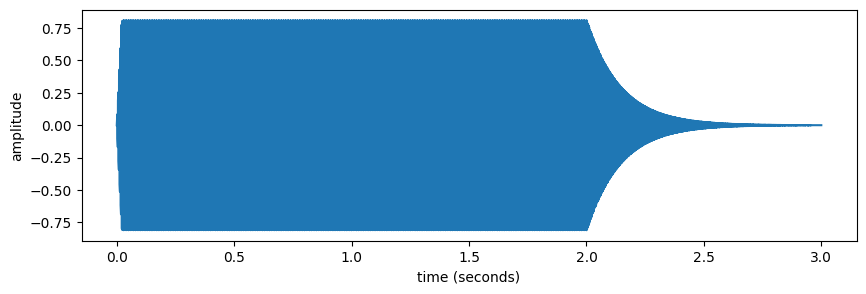

In [4]:
# read and display a sound
sound_array, sampling_rate = read_sound('../sounds/synthetic.wav')
display_sound(sound_array, sampling_rate)

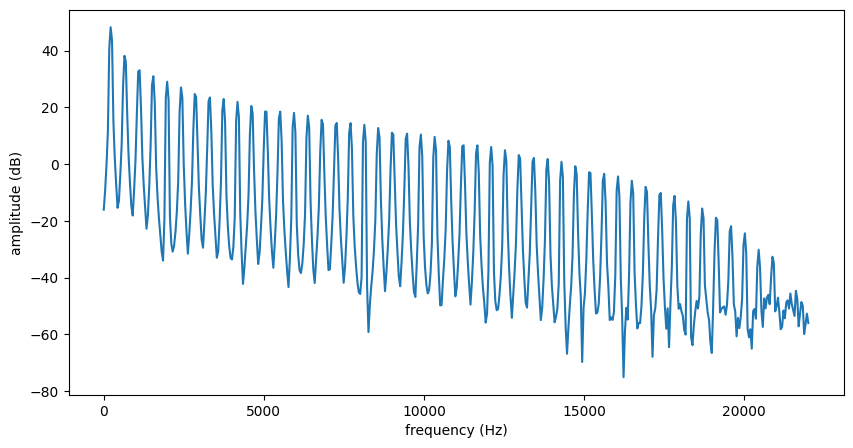

In [5]:
# display spectrum of a stable fragment of sound_array, try different values for fft_size, all being a power of 2
# ex: 256, 1024, 2048
fft_size = 1024
sample_offset = int(1.0 * sampling_rate) # choose the starting sample at 1 second
display_spectrum(sound_array[sample_offset:sample_offset+fft_size], sampling_rate)

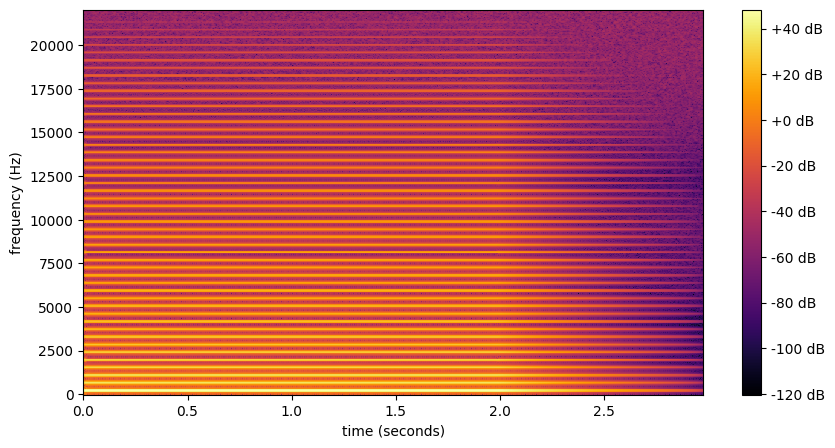

In [6]:
# display spectrogram of x, try different values for fft_size, all being a power of 2
# ex: 256, 1024, 2048
hop_size = 128
fft_size = 1024
display_spectrogram(sound_array, hop_size, fft_size, sampling_rate)

**Questions: (answer them in this text cell)**

1. Explain the effect of the different fft_size values in the spectrum and spectrogram displays of the `synthetic.wav` sound. Example values to try: 256, 1024, 2048. Modify the code above as necessary and refer to it and to the resulting plots to support the explanation.


To look for the effect it has changing the FFT size in the spectrum and spectogram, we have introduced 4 different sizes shown below:

**FFT SIZE: 256**

With a smaller FFT size, the spectrum has a limited concentration of peaks with minimum variation between maxima and minima, leading to an unclear or "odd" plot. Then, for the spectogram, we see how all the frequency components are closely packed, making it difficult to distinguish between them.

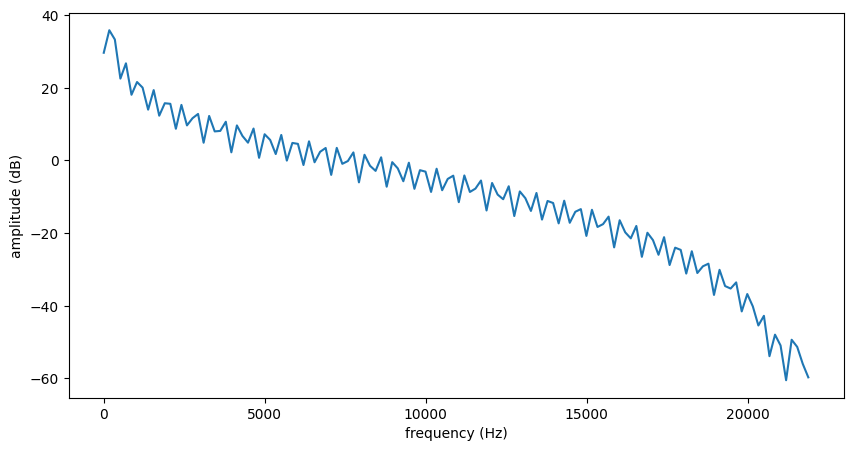
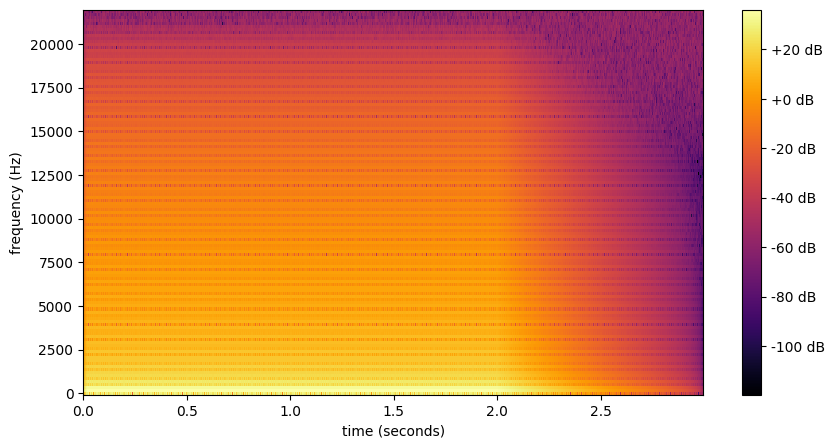

**FFT SIZE: 512**

From there on, we observe how increasing the FFT size makes the spectrum and spectogram smoother, also defining a much clear minima and maxima, so we don't need to talk about them much and we will include the 512 and 1024 in the sam explanation.

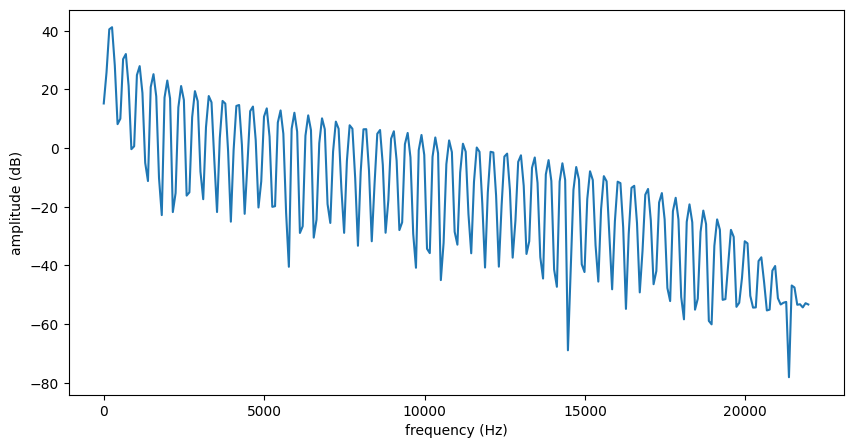
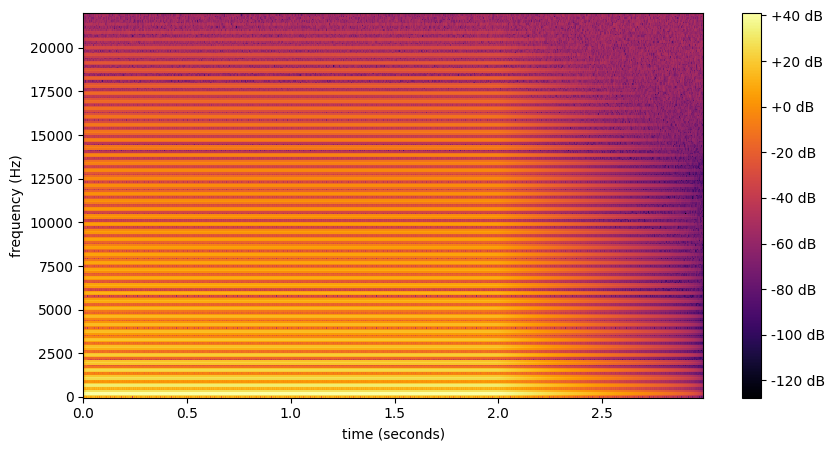

**FFT SIZE: 1024**

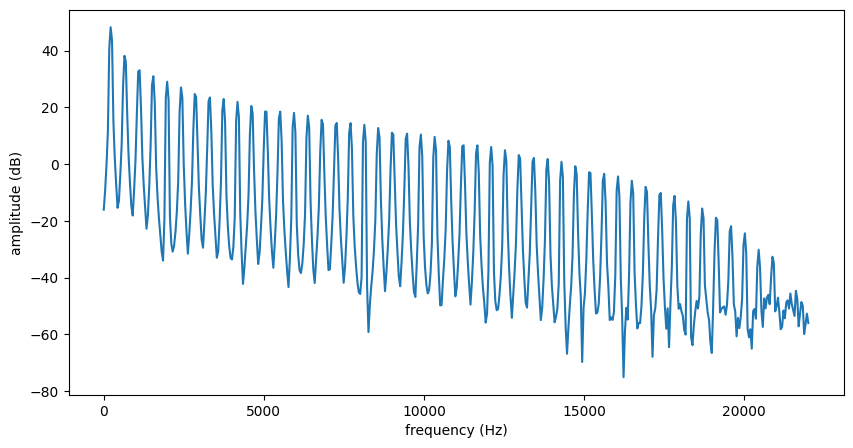
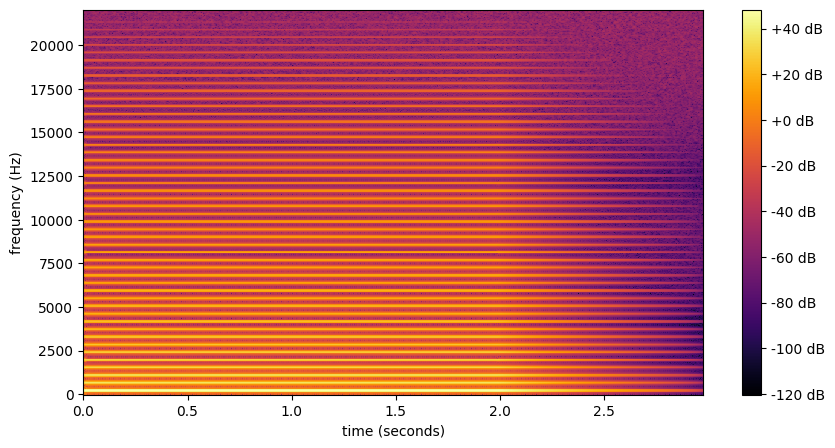

**FFT SIZE: 2048**

However, we want to stop a moment to discuss about a high FFT size value as we can observe here, for a big M and high frequencies, we observe how it appear distortions. It also can be seen in the spectogram as it isn't much clear the high frequency components.

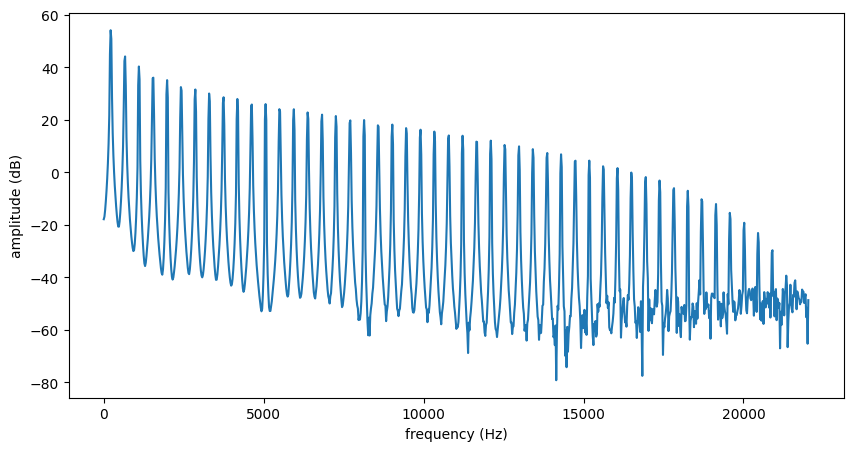
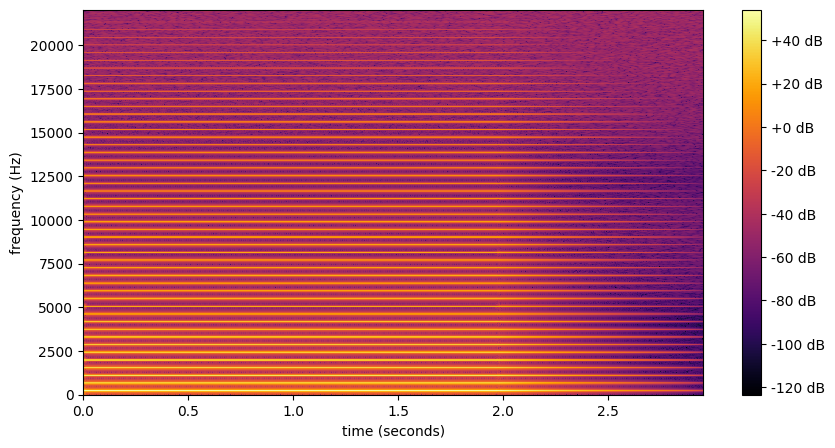

Finally, we can conclude that a big FFT size help the spectrum and spectogram to be smoother, but we have to take a look to the selected value as a very big one can introduce distortion in high frequencies. However, we can also talk about the time-frequency compromise, denoting that for a small M, there will be good time resolution (in the spectogram), but poor frequency resolution, and for a big M, the inverse will be applied. We haven't talked about it much because as the sound is more or less plain, the temporal resolution isn't important in this case and we can't see the differences in the spectogram.


2. What is the fundamental frequency, in Hz, of the `synthetic.wav` sound?. Explain how you identifyied it. Modify or add any code and plots above to support your answer.

To identify the fundamental frequency, we have many options. Visually, we can look for the common factor that applies for every frequency component, or also we could find the first peak of the spectra. For this last case, we have:

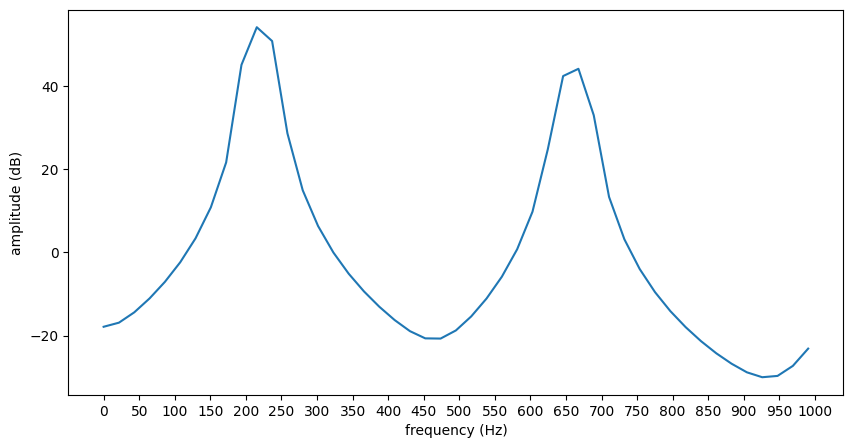

There, we see how the first peak is around 220Hz, wich correspond to the first harmonic or fundamental frequency. However, another property we see visually is that the fundamental frequency doesn't correspond to the distance between peaks but the half of this distance. This is given because the harmonics shown as peaks in this waveform are only the odd ones, a typicial sound of instruments like clarinets, where the even-numbered harmonics have a small presence.

Another option would be applying peak detection and substracting the first peak, first harmonic (fundamental frequency).

----

## Part 2 - Resample sound

Resample (decimate) and change the bits per sample (quantize) a sound signal by different amounts and compare the results. Find the highest compression that still keeps the perceptual qualities of the original sound. Answer the questions given and modify the code as needed.

In [7]:
def quantize_signal(x, original_bits, target_bits):
  """Quantizes a signal x, assuming it originally had original_bits bits per sample, to target_bits per sample.
  Args:
    x (numpy.array): Array of samples as floating point values between -1 and 1
    original_bits (int): Number of bits of the signal that x represents
    target_bits (int): Number of bits per sample of the output signal
  """
  # Scaling the signal to the range of [0, 2^target_bits - 1]
  x_scaled = (x - np.min(x)) / (np.max(x) - np.min(x)) * (2**target_bits - 1)
  # Quantize by rounding
  x_quantized = np.round(x_scaled)
  # Re-scaling back to the original amplitude range
  x_output = (x_quantized / (2**target_bits - 1)) * (np.max(x) - np.min(x)) + np.min(x)
  return x_output


**Questions: (answer in this text cell)**

1. Modify the decimation factor applied to the `synthetic.wav`. What is the biggest decimation for which you do not hear a difference? Change the demination factor in the code and explain the result supporting your answer with any needed plot. Use both the waveform and the spectrum.


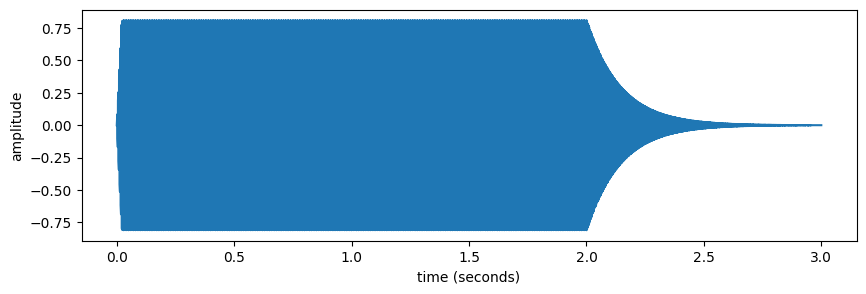

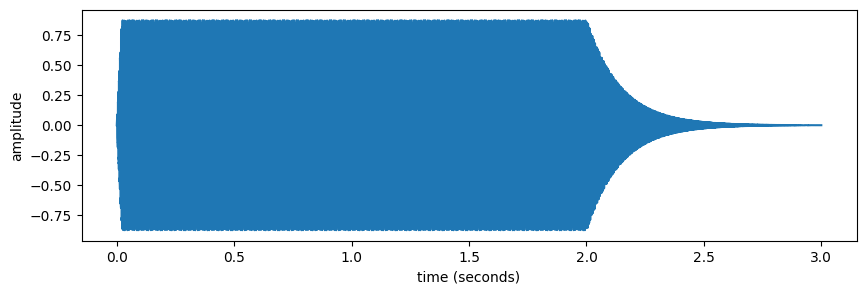

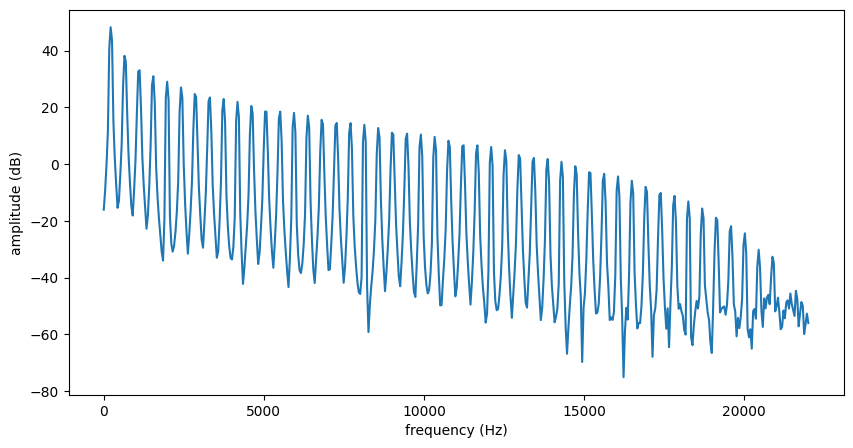

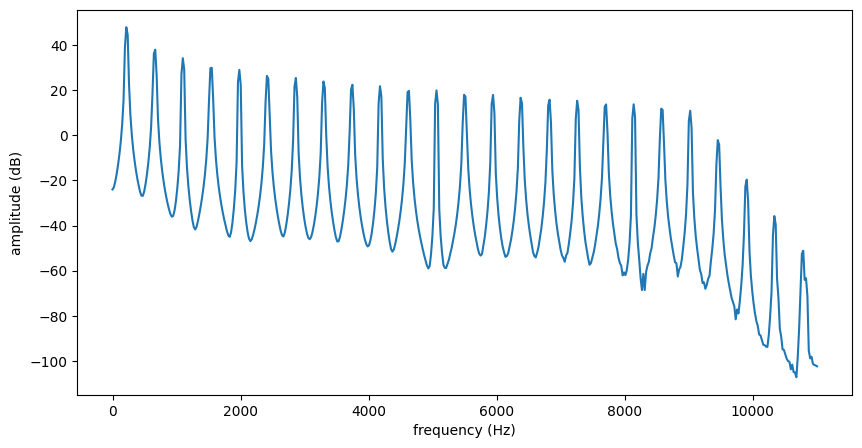

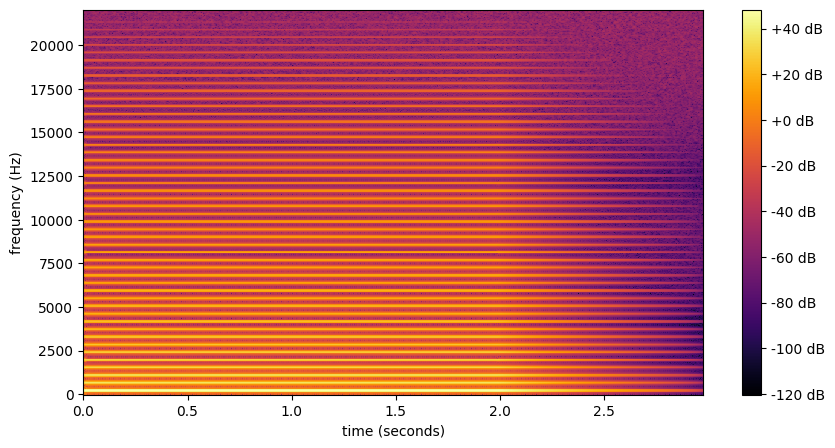

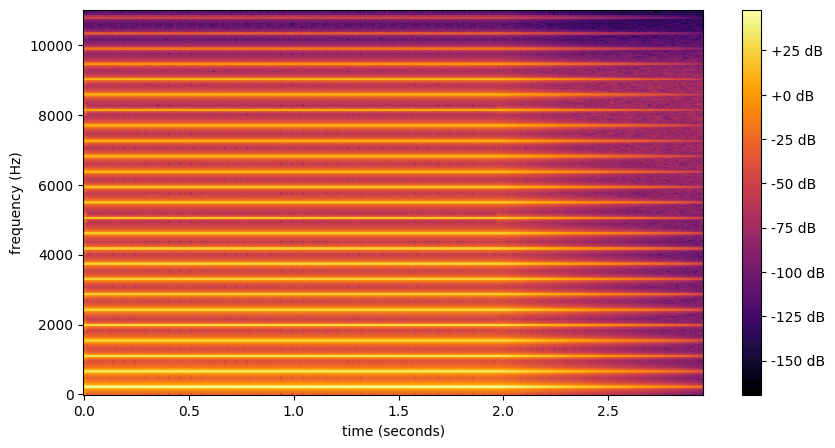

In [14]:
display_sound(sound_array, sampling_rate)

# change the decimate_factor (dowmnsample the sound) and find the lowest sampling rate for which you do not hear a difference
decimate_factor = 2   # 2 means reducing the sampling rate to half of the original
decimated_sound_array = signal.decimate(sound_array, decimate_factor)
display_sound(decimated_sound_array, sampling_rate/decimate_factor)

# display spectrum of a stable fragment of sound_array
fft_size = 1024
sample_offset = int(1.0 * sampling_rate) # choose the starting sample at 1 second
display_spectrum(sound_array[sample_offset:sample_offset+fft_size], sampling_rate)

# display spectrum of a stable fragment of sound_array
fft_size = 1024
sample_offset = int(1.0 * sampling_rate/decimate_factor) # choose the starting sample at 1 second
display_spectrum(decimated_sound_array[sample_offset:sample_offset+fft_size], sampling_rate/decimate_factor)

# display spectrogram of x
hop_size = 128
fft_size = 1024
display_spectrogram(sound_array, hop_size, fft_size, sampling_rate)
# display spectrogram of x
hop_size = 128
fft_size = 1024
display_spectrogram(decimated_sound_array, hop_size, fft_size, sampling_rate/decimate_factor)

When applying a decimation factor, we only can apply an integer number and 2 is the best while respecting the sound. As we can observe in the graphics, applying a decimation also implies reducing the Nyquist frequency. This time, as we are using a 2, the maximum frequency is halved to 11025 Hz but still no change is percieved. However, if we use a factor of 3, then the frequency is reduced to 7350 Hz and we start percieveing a less rich sound, with missing high-pitch components.



2. Modify the quantization applied to the `synthetic.wav`. What is the biggest quantization for which you do not hear a difference?. Change the number of bits in the code and explain your answer supporting it with any needed plot.


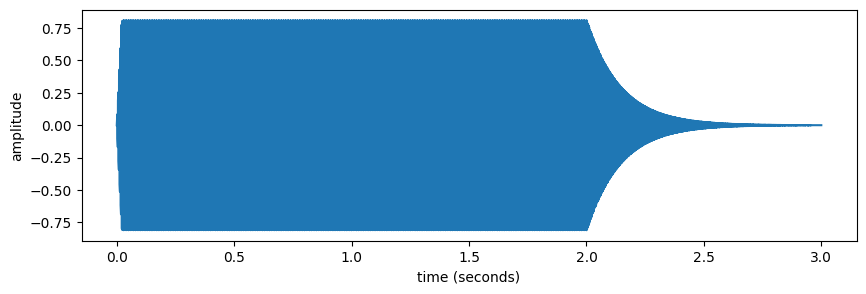

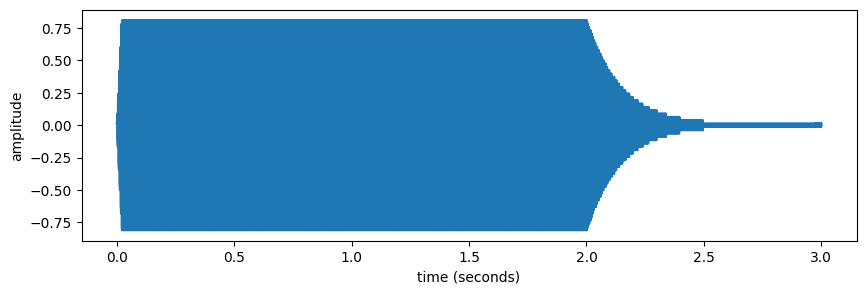

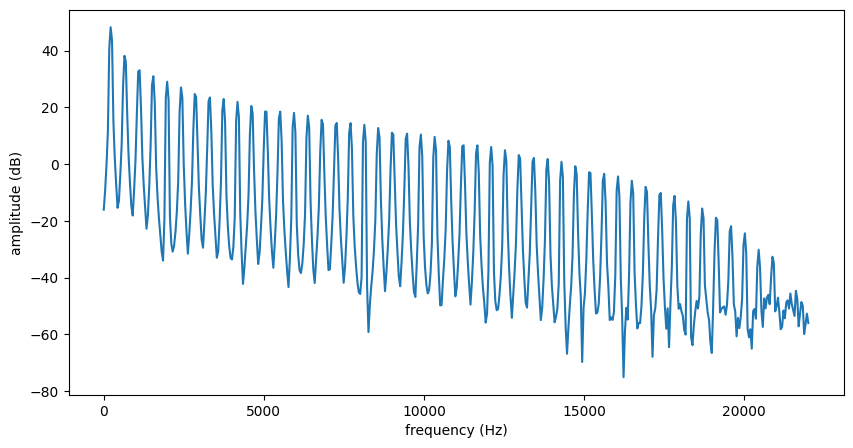

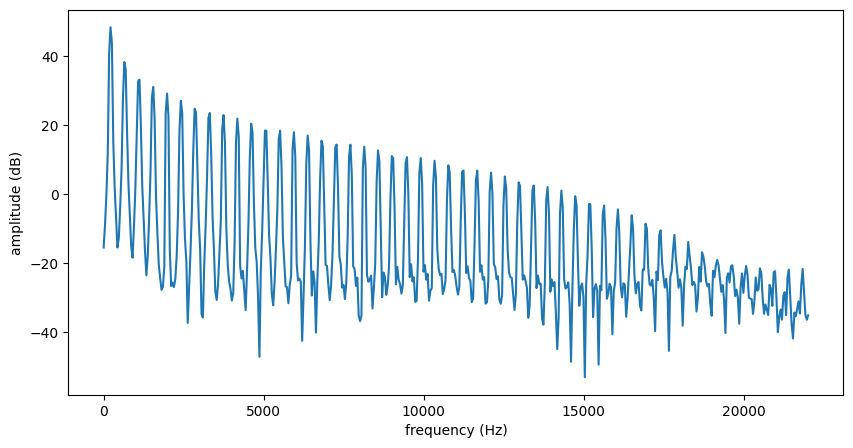

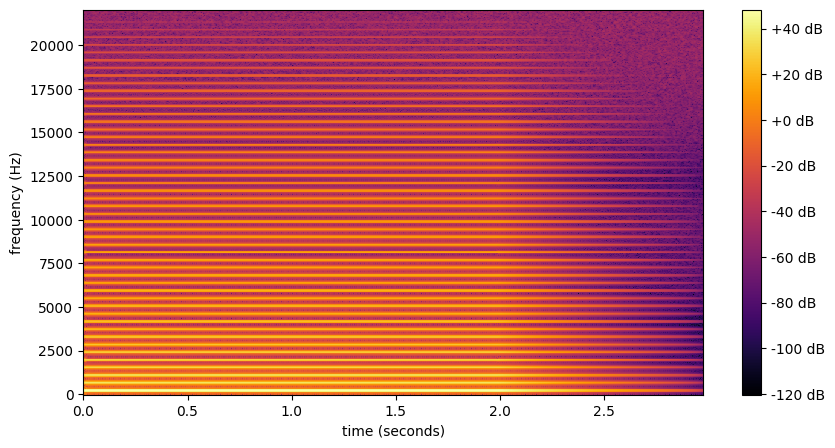

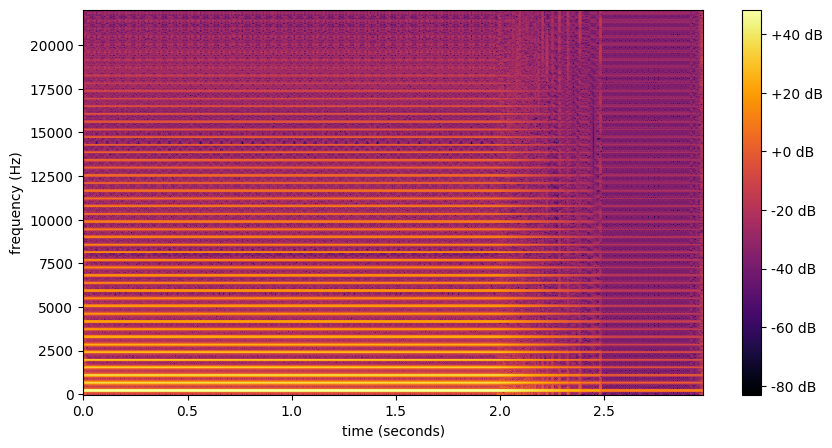

In [13]:
display_sound(sound_array, sampling_rate)

# change the number_of_bits of the samples and find the lowest number for which you do not hear a difference
number_of_bits = 7   # 8 means to reduce the number of bits per sample to half of the original, which is 16
quantized_sound_array = quantize_signal(sound_array, 16, number_of_bits)
display_sound(quantized_sound_array, sampling_rate)

# display spectrum of a stable fragment of sound_array
fft_size = 1024
sample_offset = int(1.0 * sampling_rate) # choose the starting sample at 1 second
display_spectrum(sound_array[sample_offset:sample_offset+fft_size], sampling_rate)

# display spectrum of a stable fragment of sound_array
fft_size = 1024
sample_offset = int(1.0 * sampling_rate/decimate_factor) # choose the starting sample at 1 second
display_spectrum(quantized_sound_array[sample_offset:sample_offset+fft_size], sampling_rate)

# display spectrogram of x
hop_size = 128
fft_size = 1024
display_spectrogram(sound_array, hop_size, fft_size, sampling_rate)

# display spectrogram of x
hop_size = 128
fft_size = 1024
display_spectrogram(quantized_sound_array, hop_size, fft_size, sampling_rate)


When applying quantization, we found that reducing the representation to 7 bits still reproduce accordingly the sound. The diference when we started reducing the number of bits to 6 or less is that at the end of the sound (when it fades out), the approximation wasn't a soft fade but rather you could still hear the sound. This already can be seen in the spectogram of the quantization by 7, where from the 2s it appear strange artifacts but this time aren't perceptible.


3. Compress the sound `synthetic.wav` by applying both decimation and quantization. What it the highest compression factor you get without losing the perceptual quality of the original sound when performing both a decimation and a quantization?. Explain your answer supporting it with any needed plot.


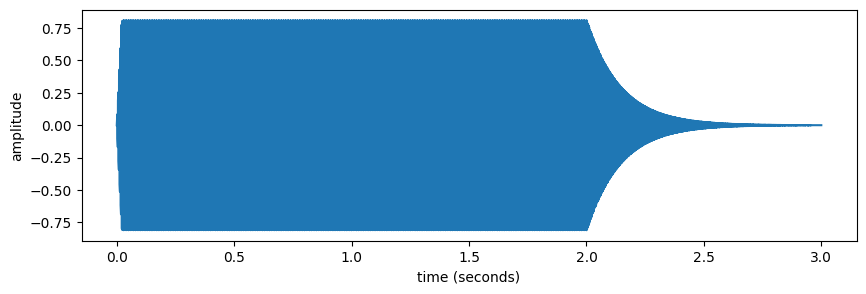

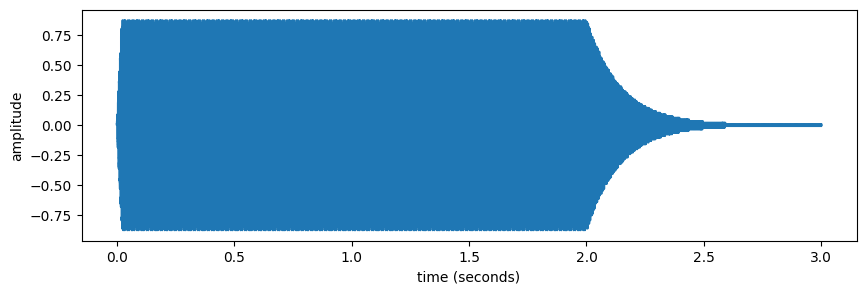

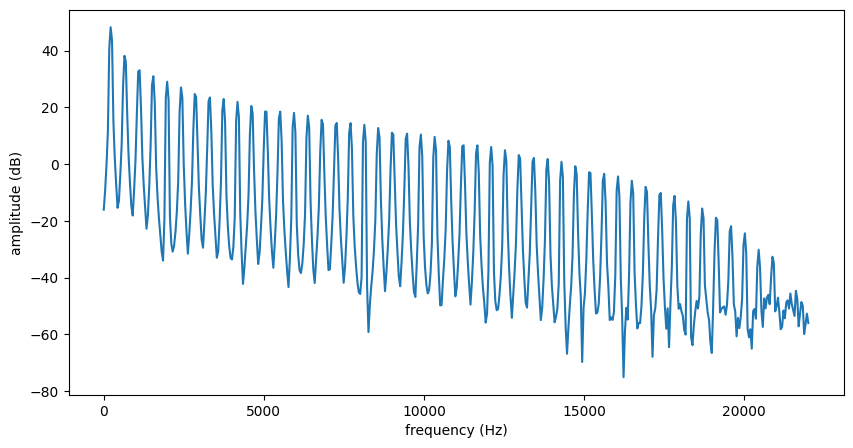

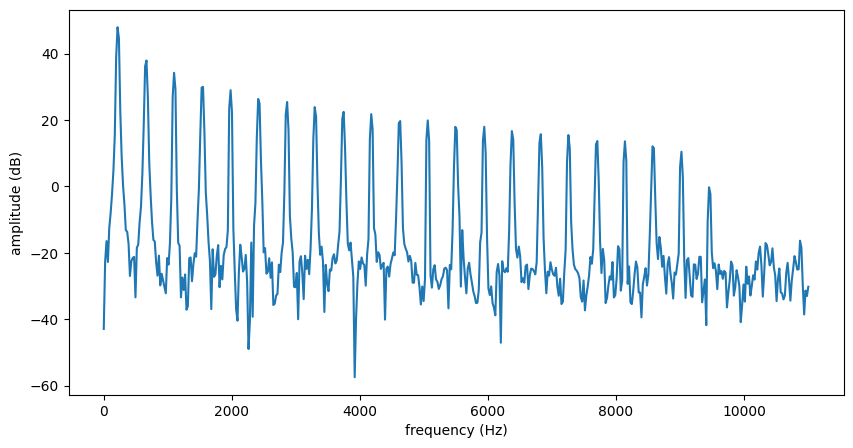

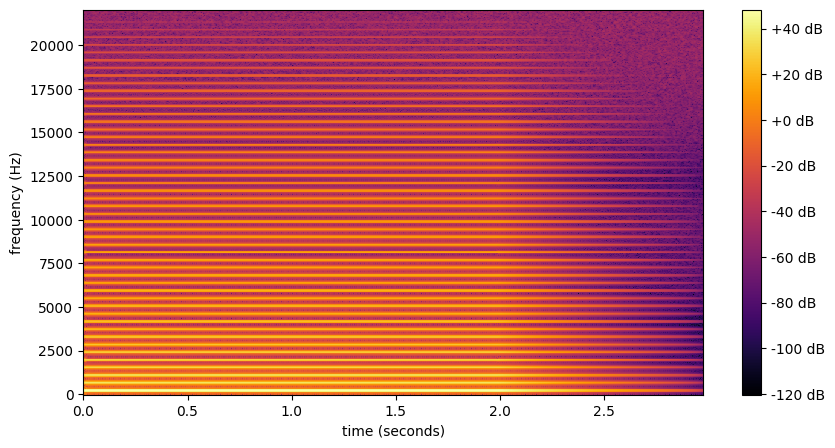

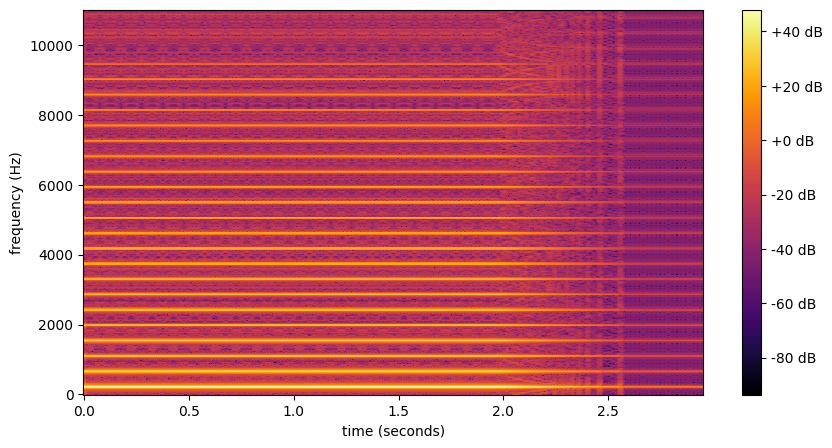

In [23]:
display_sound(sound_array, sampling_rate)

# change the decimate_factor (dowmnsample the sound) and the number_of_bits (quantize)
# to find the most compressed signal for which you do not hear a difference
number_of_bits = 7
decimate_factor = 2
decimated_and_quantized_sound_array= quantize_signal(signal.decimate(sound_array, decimate_factor), 16, number_of_bits)
display_sound(decimated_and_quantized_sound_array, sampling_rate/decimate_factor)

# display spectrum of a stable fragment of sound_array
fft_size = 1024
sample_offset = int(1.0 * sampling_rate) # choose the starting sample at 1 second
display_spectrum(sound_array[sample_offset:sample_offset+fft_size], sampling_rate)

# display spectrum of a stable fragment of sound_array
sample_offset = int(1.0 * sampling_rate/decimate_factor) # choose the starting sample at 1 second
display_spectrum(decimated_and_quantized_sound_array[sample_offset:sample_offset+fft_size], sampling_rate/decimate_factor)

# display spectrogram of x
hop_size = 128
display_spectrogram(sound_array, hop_size, fft_size, sampling_rate)

# display spectrogram of x
display_spectrogram(decimated_and_quantized_sound_array, hop_size, fft_size, sampling_rate/decimate_factor)



Although analising the spectograms, one would say it isn't the same sound, if we keep the values for quantization and decimation from the previous questions, we have a much similar one. We have the reduction of frequencies explained for the decimation and the artifacts at the end because of the quantization, but not perceptible. We observe that the combination of both factors doesn't help to be able to increase the decimation or decrease the bits without changing notably the original sound. Still, we could compress the sound a 78.1% compared to the original (corresponds to a 21.8% of the original). 

This number can be expressed as the combination of the quantization factor (7/16) and the decimation (1/2).

## Part 3 - Apply audio coding
Compress an audio signal with mp3, using different bit rates to control the compression. Find the lowest bit rate for which you do not hear a difference. Change the code as needed and answer the questions given.

wav file size: 264644 bytes
mp3 file size: 73394 bytes


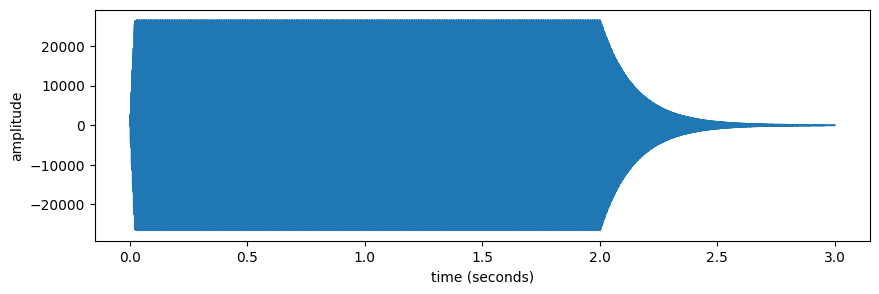

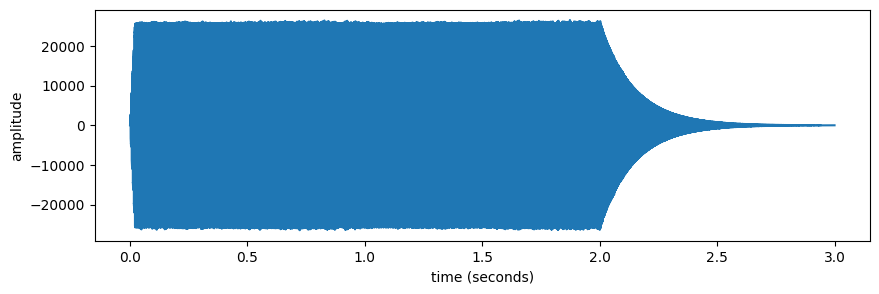

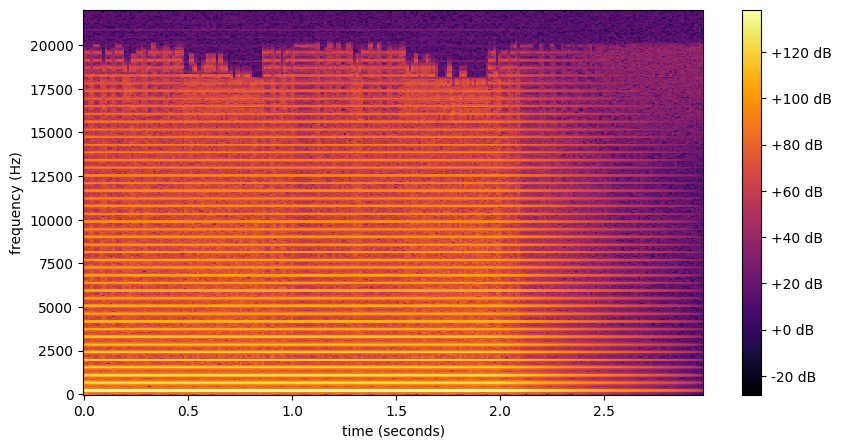

In [33]:
# read the audio file using AudioSegment
audio1 = AudioSegment.from_wav('../sounds/synthetic.wav')
wav_file_size = os.path.getsize('../sounds/synthetic.wav')
print(f'wav file size: {wav_file_size} bytes')

# change the bit_rate used in the compression, try: 256kbits/s, 192kbits/s, 96kbits/s, 32kbits/s.
# find the lowest bitrate for which you do not hear a difference
bit_rate ="192k"

# compress the sound with mp3
audio1.export('synthetic.mp3', format="mp3", bitrate=bit_rate)

# read the compressed mp3 file
audio2 = AudioSegment.from_mp3('synthetic.mp3')
mp3_file_size = os.path.getsize('synthetic.mp3')
print(f'mp3 file size: {mp3_file_size} bytes')

# display the original and compressed sound
x = np.array(audio1.get_array_of_samples())
y = np.array(audio2.get_array_of_samples())
display_sound(x,audio1.frame_rate)
display_sound(y,audio2.frame_rate)
display_spectrogram(y, 512, 1024, audio2.frame_rate)

**Questions: (answer in this cell)**

1. Apply mp3 compression to the `synthetic.wav`sound. Explain the perceptual effect of different bit rates in the mp3 coding, 256kbits/s, 192kbits/s, 96kbits/s, 32kbits/s. Use the spectrograms of the original and compressed sounds to suport your explanation. What is the lowest bit rate for which you do not hear a significant difference?


Easily, from the spectograms of the compressed sound by different bit rates, we can have a notice of what mp3 compression does. After reducing the rate, only at some points of the sound the high frequencies dissapear. Also, from the spectra we could see something similar. And that's because mp3 compression takes into account the psychoacoustic model and discards the frequencies masked or also the masked sounds (usually when they are one just before or after the other). Also, it enriches high frequencies as we can see that now the energy goes to +120dB.

At this point, a 256kb/s and 192kb/s rate is good enough to respect the original sound, where checking the spectograms there is not much change but some reduced adjacent high frequency components.

From there, we probably would say that a rate of 96kb/s would also be good as in the frequency domain the change isn't very rough but perceptually, once we listen and compare, we see how the sound gets blurred (no plain sound but some minor changes in intensity and pitch).

**Original**
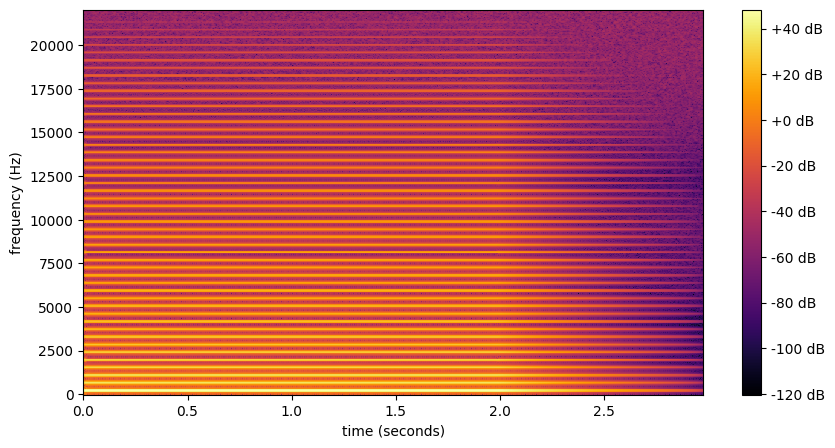

**256kb/s**
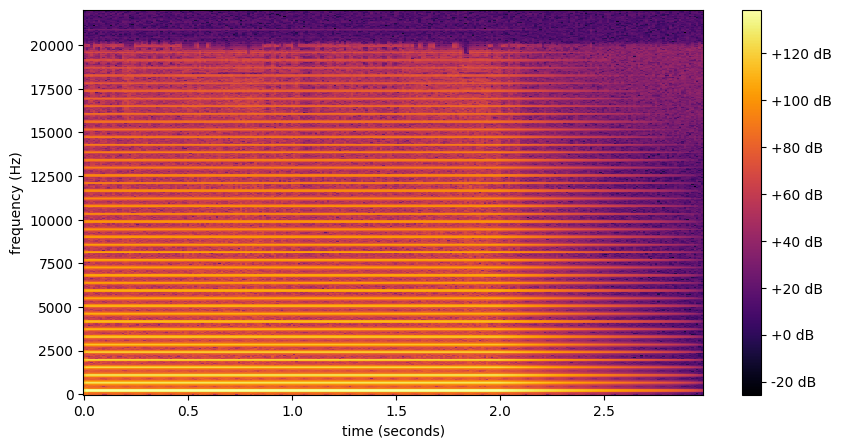

**192kb/s**
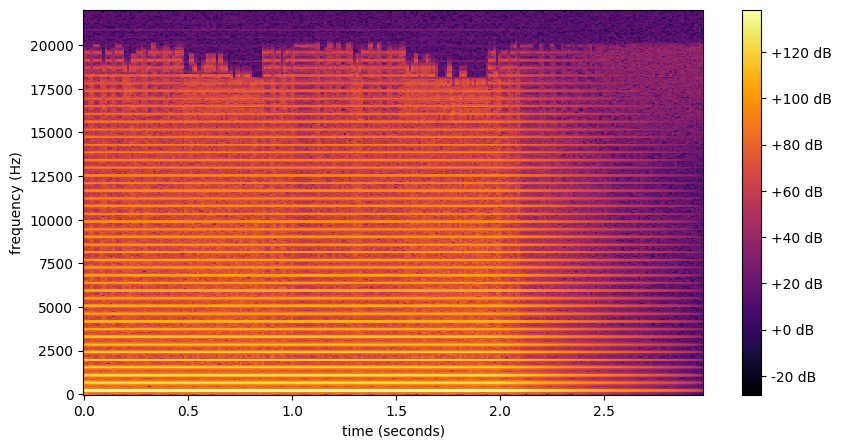

**96kb/s**
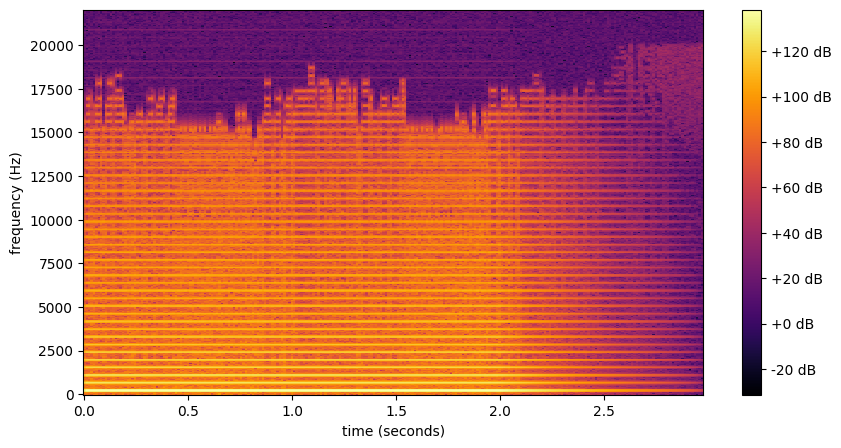

**32kb/s**
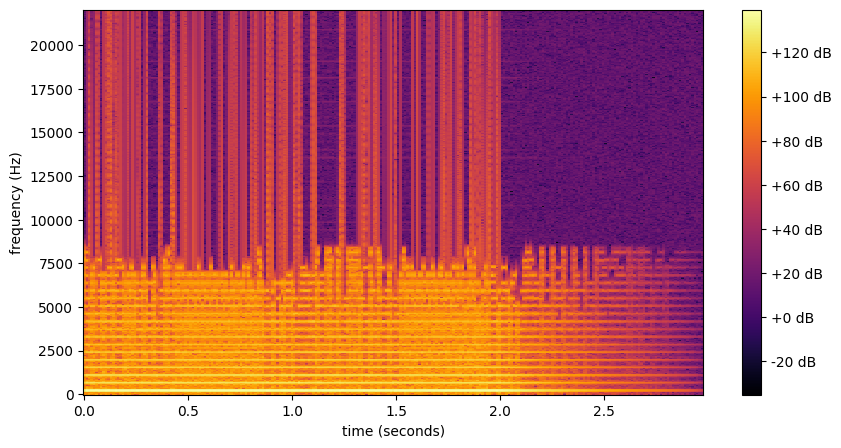


2. Calculate the compression factor obtained by comparing the sizes of the original and the most compressed but good sounding compressed file. Also compute the compression factor by comparing the bit_rate of original sound with the bit_rate of this compresed sound. Any difference? If so, explain the reason.


73394/264644
192kb/s // 


----